In [2]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.mixture import GaussianMixture
from matplotlib.patches import Ellipse
from scipy.stats import multivariate_normal
import os
from scipy.io import loadmat

In [11]:

def load_specific_data(root, dist, pow, spacing, osnr):
    spacing = spacing.replace(".", "p")
    osnr = osnr.replace(".", "p")
    sub_dir = f"{root}/{dist}km_{pow}dBm/{spacing}GHz/"
    # revisar datos
    files = os.listdir(sub_dir)
    try:
        for f in files:
            if f"_{osnr}dB_" in f and f.endswith(".mat"):
                data = loadmat(f"{sub_dir}/{f}")["rconst"][0]
                return data
    except Exception as e:
        print(f"Error loading data: {e}")
        return None
def calculate_gmm(data, gm_kwargs):
    return GaussianMixture(**gm_kwargs).fit(data)

def calculate_data(x):
    def split(a, n):
        k, m = divmod(len(a), n)
        return np.array(
            [a[i * k + min(i, m): (i + 1) * k + min(i + 1, m)] for i in range(n)]
        )
    x_split = split(x, 3)
    x_ch = x_split[0]
    input_data = np.vstack((x_ch.real, x_ch.imag)).T
    return input_data
def show_projected_gaussians(data, n_componentes, covariance_type='diag', num_plots=None, init_centroids=False):
    # sample = data[data.index.date == date_sample]
    if init_centroids:
        # Define 16-QAM centroids
        qam_16_centroids = np.array([
            [-3, -3], [-3, -1], [-3, 1], [-3, 3],
            [-1, -3], [-1, -1], [-1, 1], [-1, 3],
            [1, -3], [1, -1], [1, 1], [1, 3],
            [3, -3], [3, -1], [3, 1], [3, 3]
        ])
        # Repeat centroids if n_componentes > 16
        if n_componentes > 16:
            repeats = n_componentes // 16 + (n_componentes % 16 > 0)
            centroids = np.tile(qam_16_centroids, (repeats, 1))[:n_componentes]
        else:
            centroids = qam_16_centroids[:n_componentes]
        gm_kwargs = {
            "n_components": n_componentes,
            "covariance_type": covariance_type,
            "init_params": "kmeans",
            "means_init": centroids,
            "random_state": 42
        }
    else: 
        gm_kwargs = {
            "n_components": n_componentes,
            "covariance_type": covariance_type,
            "random_state": 42
        }
    gmm = GaussianMixture(**gm_kwargs)
    gmm.fit(data)

    weight = gmm.weights_
    means = gmm.means_
    covariances = gmm.covariances_

    print(f"Covariance 0: {covariances[0]}")

    # Number of features
    n_f = means.shape[1] if num_plots == None else num_plots

    # Feature pairs
    feature_pairs = [(i, j) for i in range(n_f) for j in range(i + 1, n_f)]
    n_pairs = len(feature_pairs)

    # Feature names
    # feature_names = sample.columns.tolist()

    # Number of columns and rows
    n_cols = int(np.ceil(np.sqrt(n_pairs)))
    n_rows = int(np.ceil(n_pairs / n_cols))

    # fig, axes = plt.subplots(n_rows, n_cols, figsize=(3n_cols, 3n_rows))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 8))
    if n_pairs > 1:
        axes = axes.ravel()  # Flatten the axes array for easy iteration
    else:
        axes = [axes]  # Make sure it's iterable even for single plot

    for idx, (f1, f2) in enumerate(feature_pairs):
        ax = axes[idx]

        for k in range(n_componentes):
            mean = means[k, [f1, f2]]

            # Get covariance matrix based on covariance type
            if covariance_type == 'full':
                cov = covariances[k][np.ix_([f1, f2], [f1, f2])]
            elif covariance_type == 'tied':
                cov = covariances[np.ix_([f1, f2], [f1, f2])]
            elif covariance_type == 'diag':
                # Create diagonal matrix from the diagonal elements
                cov = np.diag(covariances[k, [f1, f2]])
            elif covariance_type == 'spherical':
                # Create diagonal matrix with same value
                cov = np.eye(2) * covariances[k]
            else:
                raise ValueError("Invalid covariance_type")

            # Create a grid for the contour plot
            x = np.linspace(mean[0]-3*np.sqrt(cov[0,0]), mean[0]+3*np.sqrt(cov[0,0]), 100)
            y = np.linspace(mean[1]-3*np.sqrt(cov[1,1]), mean[1]+3*np.sqrt(cov[1,1]), 100)
            X, Y = np.meshgrid(x, y)
            pos = np.dstack((X, Y))

            # Calculate PDF and reshape properly
            rv = multivariate_normal(mean, cov)
            Z = rv.pdf(pos).reshape(len(x), len(y))
            ax.contour(X, Y, Z, levels=5, alpha=0.6)
            ax.scatter(mean[0], mean[1], marker='x', s=100, label=f'Component {k+1}')
            ax.scatter(data[:,0], data[:,1], alpha=0.5, s=10)

        # ax.set_ylim(-20, 35)
        # ax.set_xlim(-20, 35)
        ax.set_xlabel(f"I", fontsize=16)
        ax.set_ylabel(f"Q", fontsize=16)
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.grid(lw=0.5, alpha=0.3, linestyle='--')

    # Hide any remaining empty subplots
    for idx in range(n_pairs, len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.savefig(f"projected_gaussians_{n_componentes}_{covariance_type}.pdf", bbox_inches='tight', pad_inches=0.05)
    plt.show()

Covariance 0: [0.10388953 0.11162613]


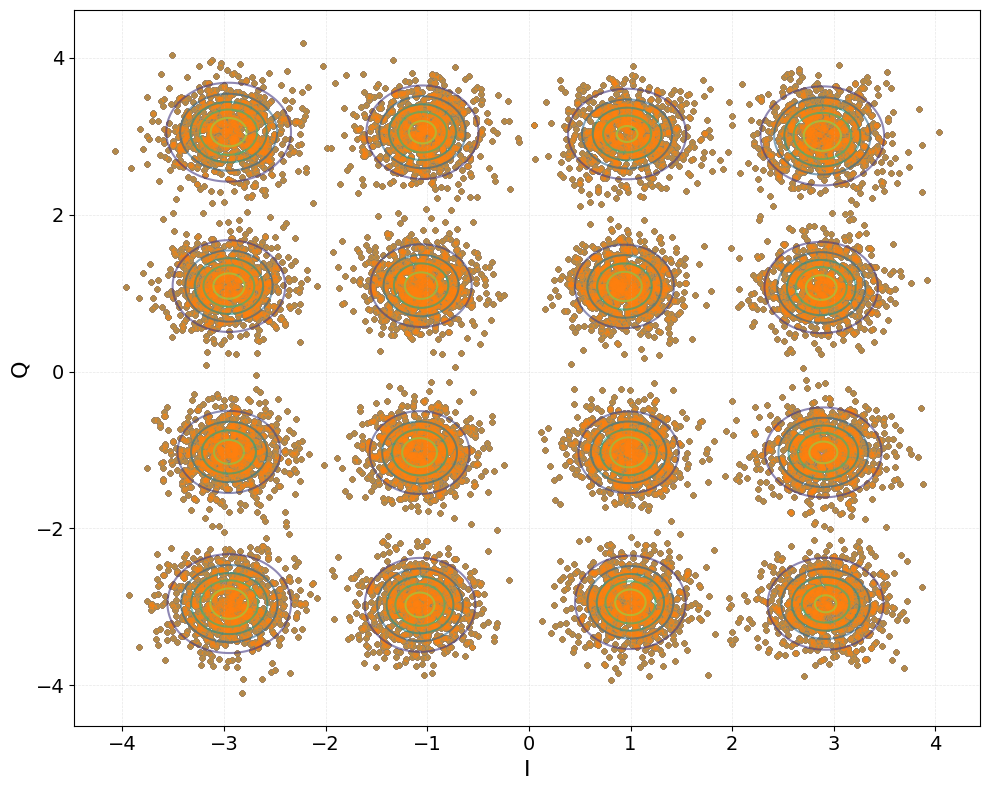

Covariance 0: [0.08558113 0.10350712]


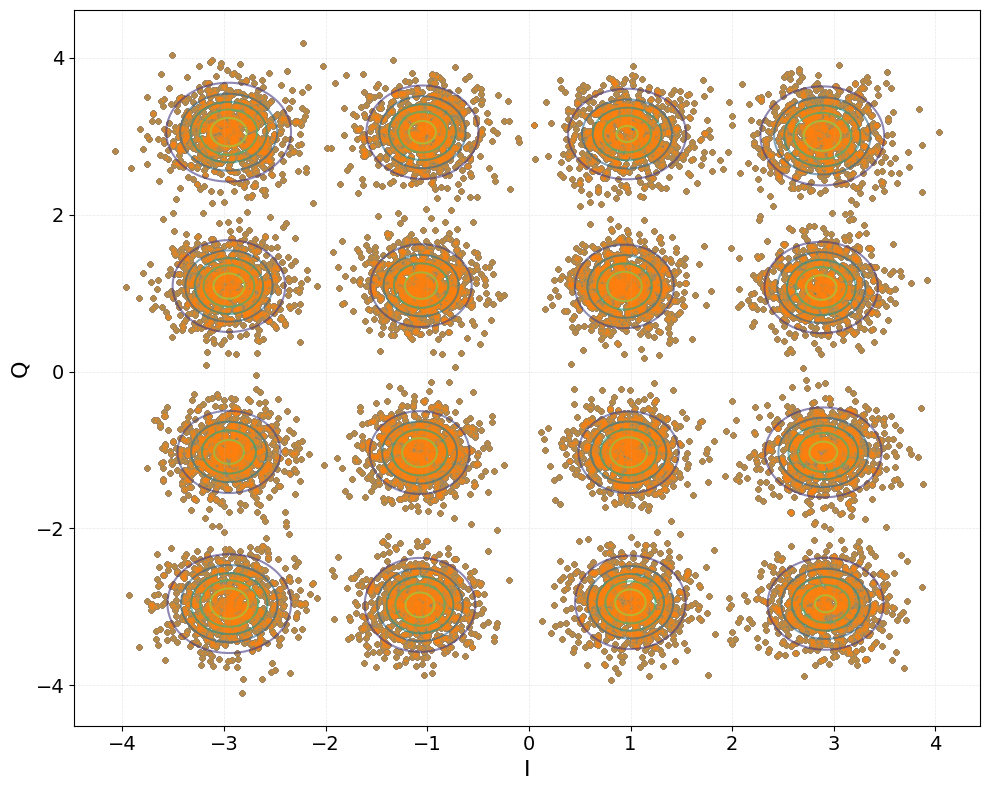

Covariance 0: 0.10759548997772303


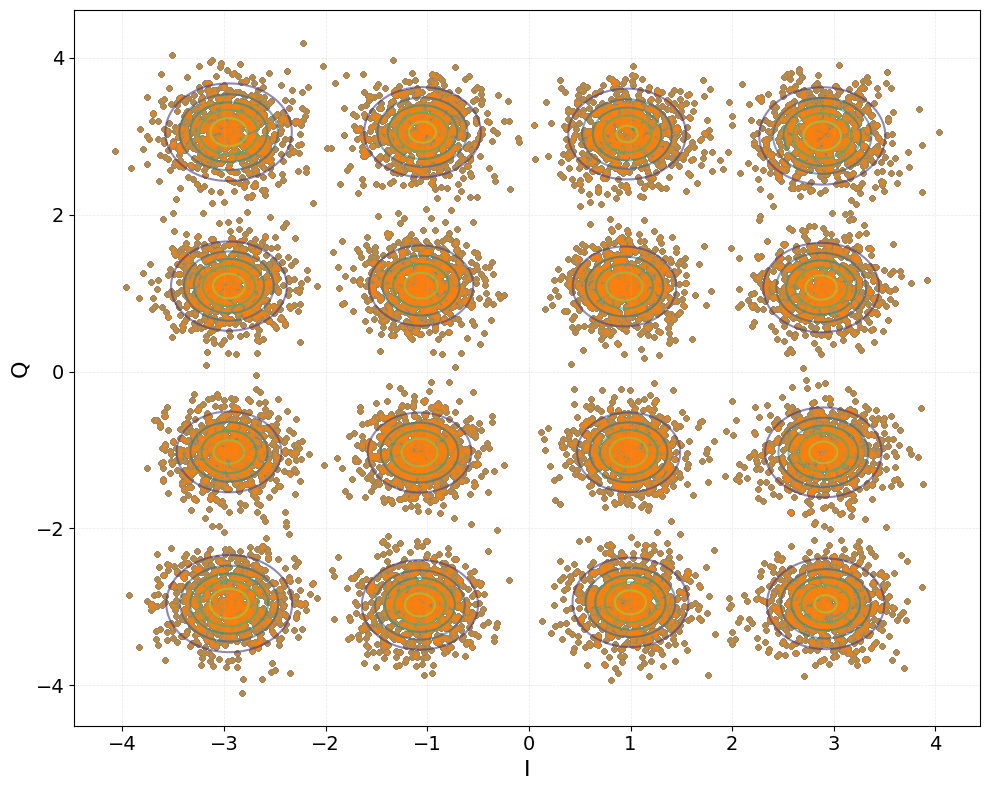

Covariance 0: 0.09466667578031704


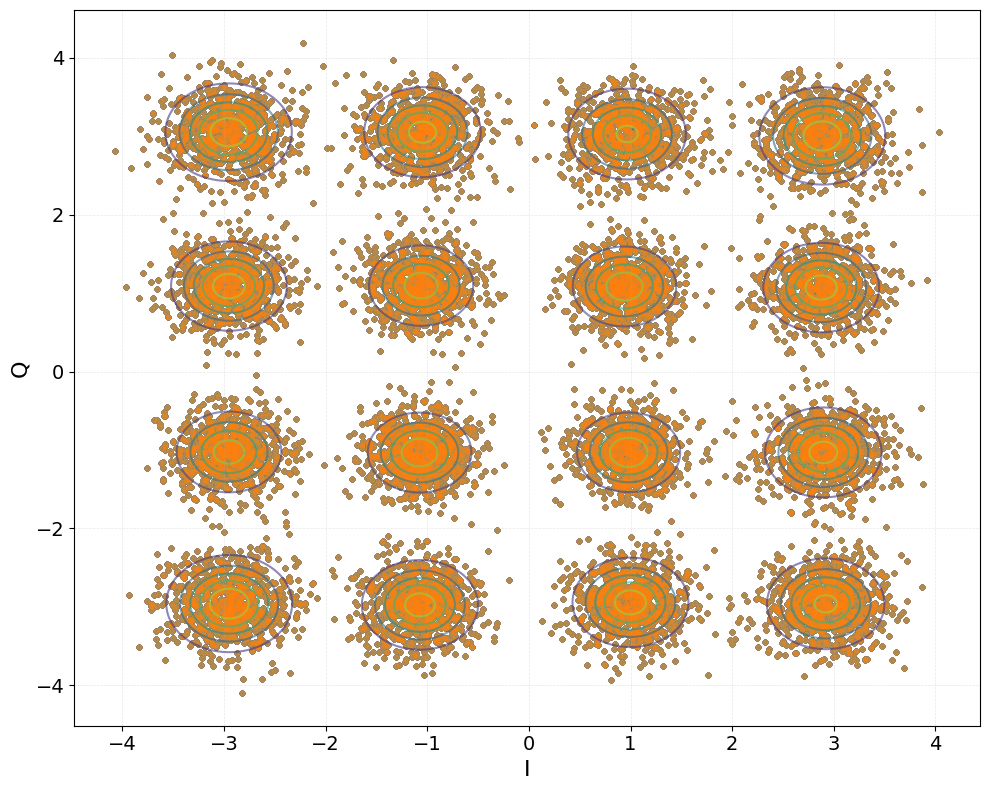

Covariance 0: [0.10762119 0.11351404]


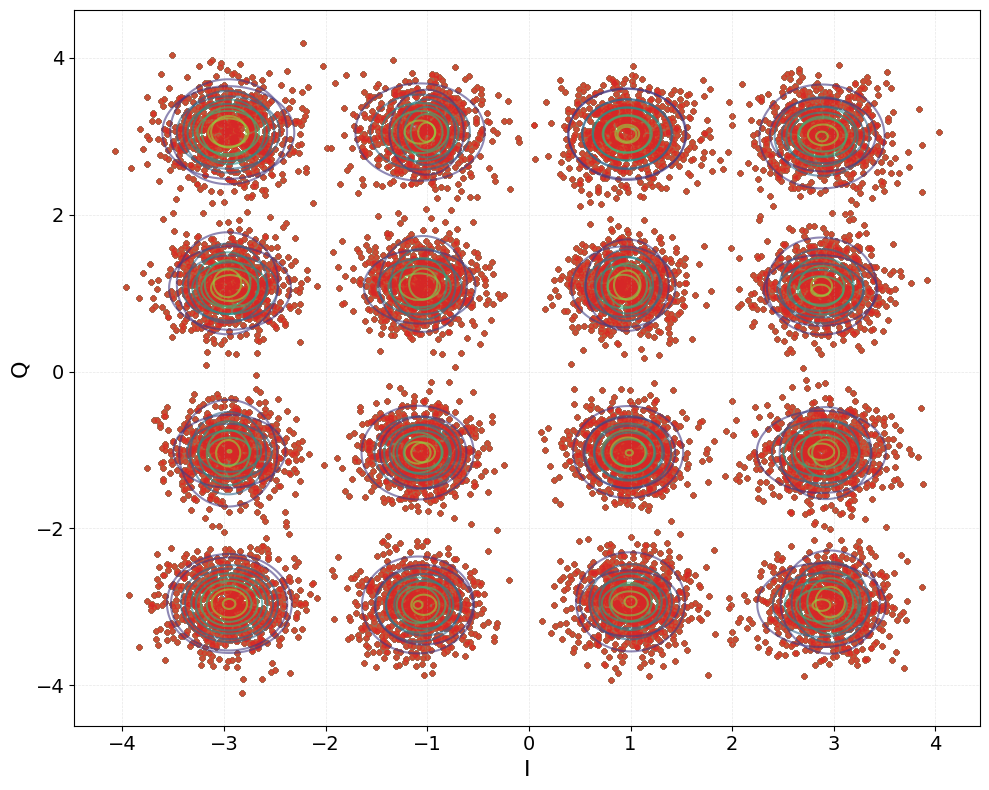

Covariance 0: [0.09020459 0.06148506]


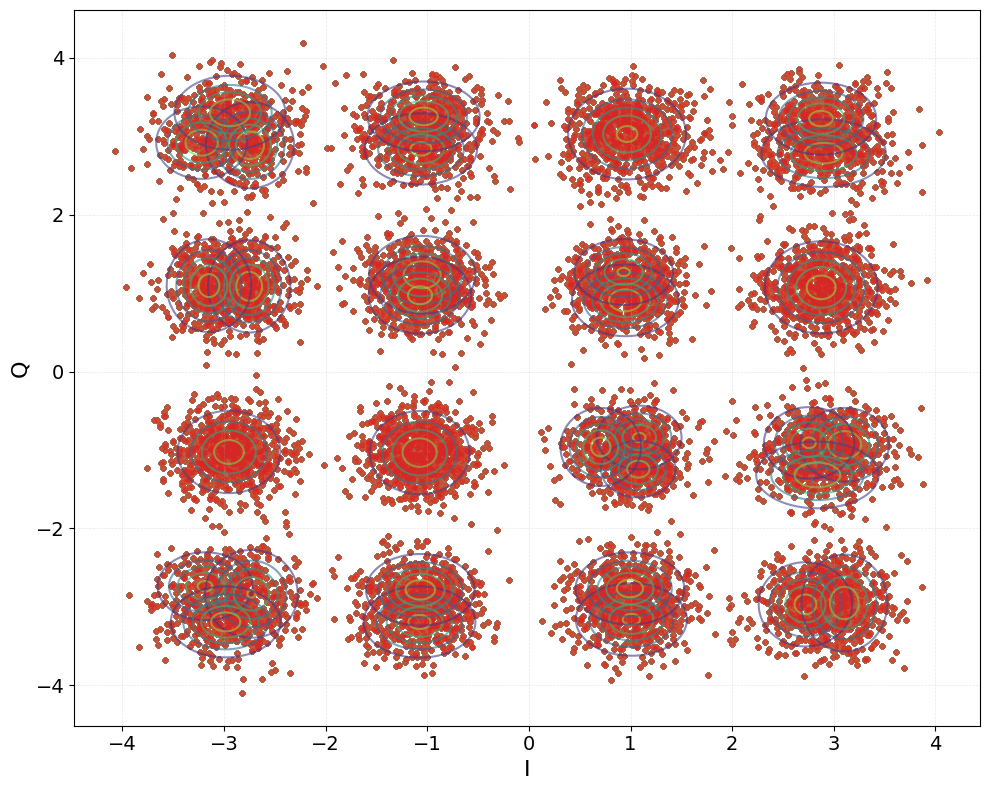

In [13]:
#datos
DATABASE_DIR = "D:/Semillero SOFA/Data32GBd/Data_Mat/BetterNames"

data_1 = load_specific_data(DATABASE_DIR, dist=0, pow=0, spacing="50", osnr="28.01")
data_2 = load_specific_data(DATABASE_DIR, dist=0, pow=0, spacing="29", osnr="22.08")

gmm1 = calculate_data(data_1)
gmm2 = calculate_data(data_2)

show_projected_gaussians(gmm1, n_componentes=16, covariance_type='diag', num_plots=2, init_centroids=True)
show_projected_gaussians(gmm1, n_componentes=16, covariance_type='diag', num_plots=2, init_centroids=False)

show_projected_gaussians(gmm1, n_componentes=16, covariance_type='spherical', num_plots=2, init_centroids=True)
show_projected_gaussians(gmm1, n_componentes=16, covariance_type='spherical', num_plots=2, init_centroids=False)

show_projected_gaussians(gmm1, n_componentes=32, covariance_type='diag', num_plots=2, init_centroids=True)
show_projected_gaussians(gmm1, n_componentes=32, covariance_type='diag', num_plots=2, init_centroids=False)



Covariance 0: [0.69637793 0.96538804]


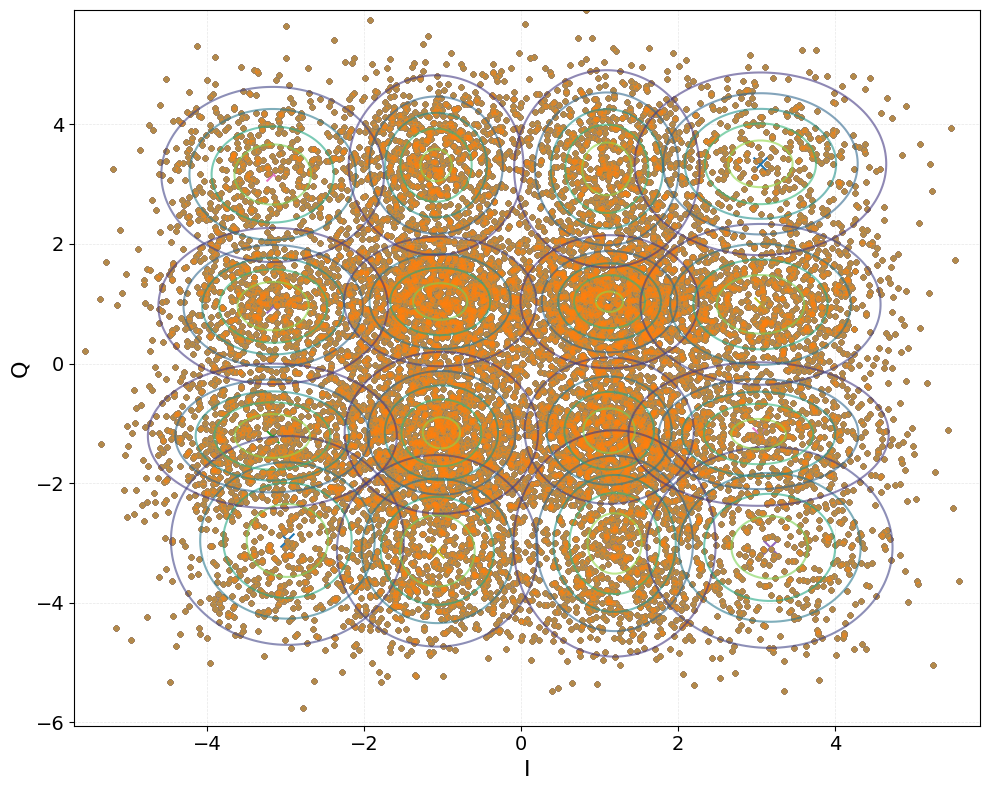

Covariance 0: [0.58202242 0.68452908]


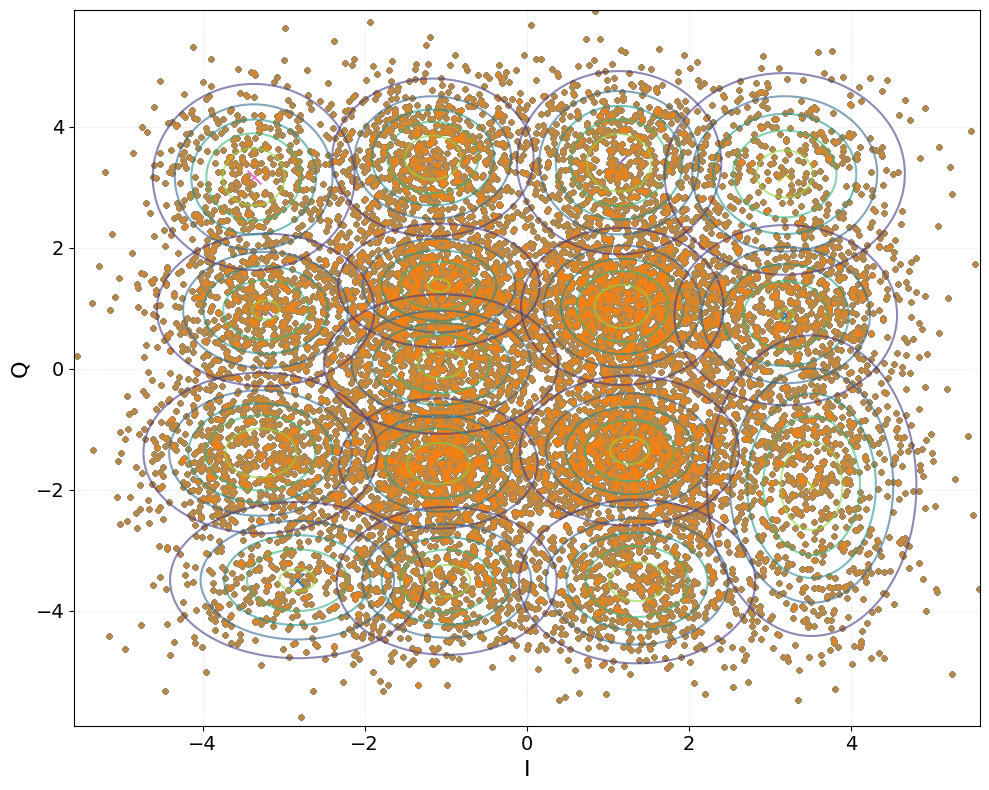

Covariance 0: 0.8438535943659139


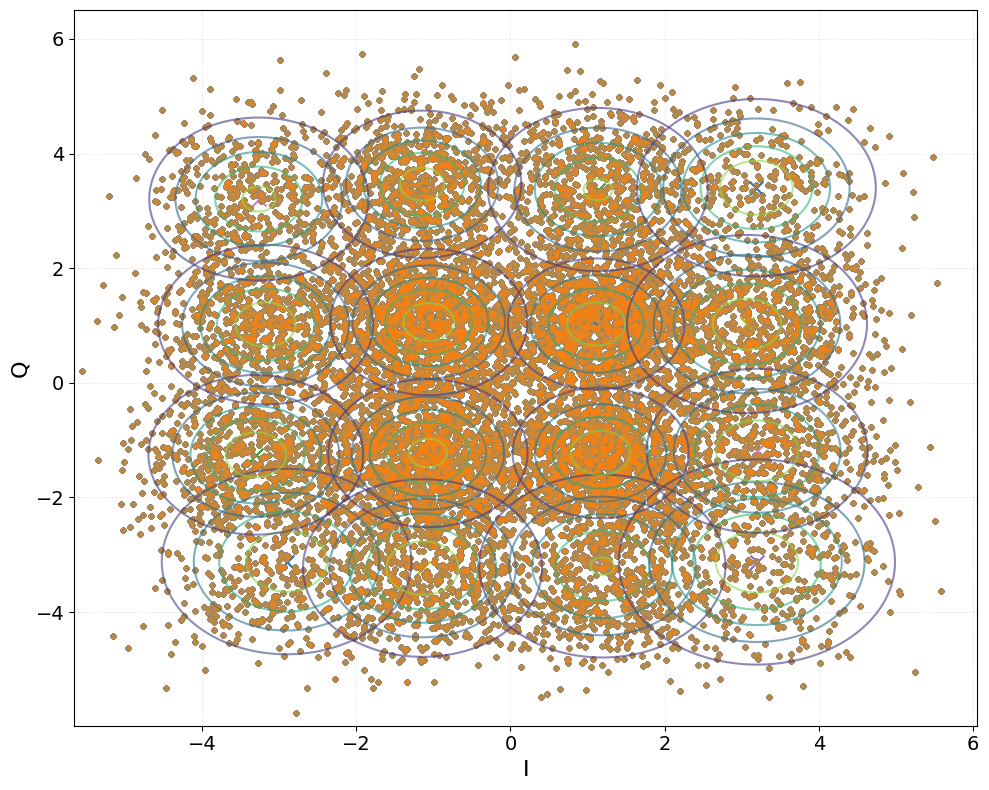

Covariance 0: 0.6415834380810381


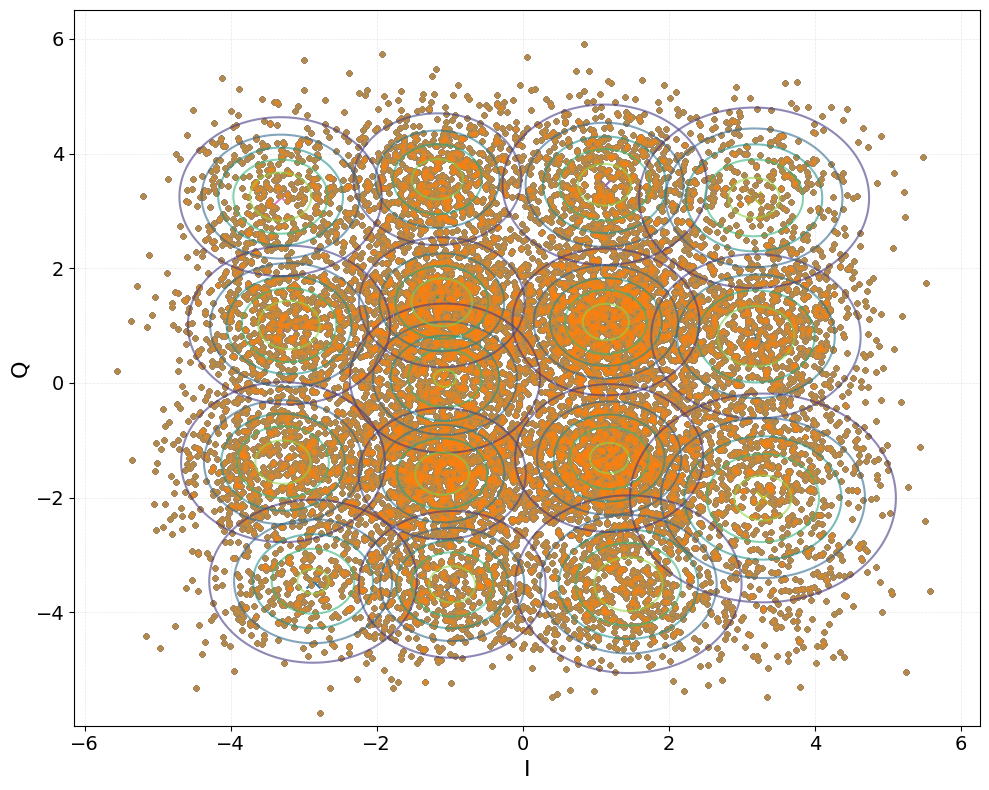

Covariance 0: [0.76929367 0.9359312 ]


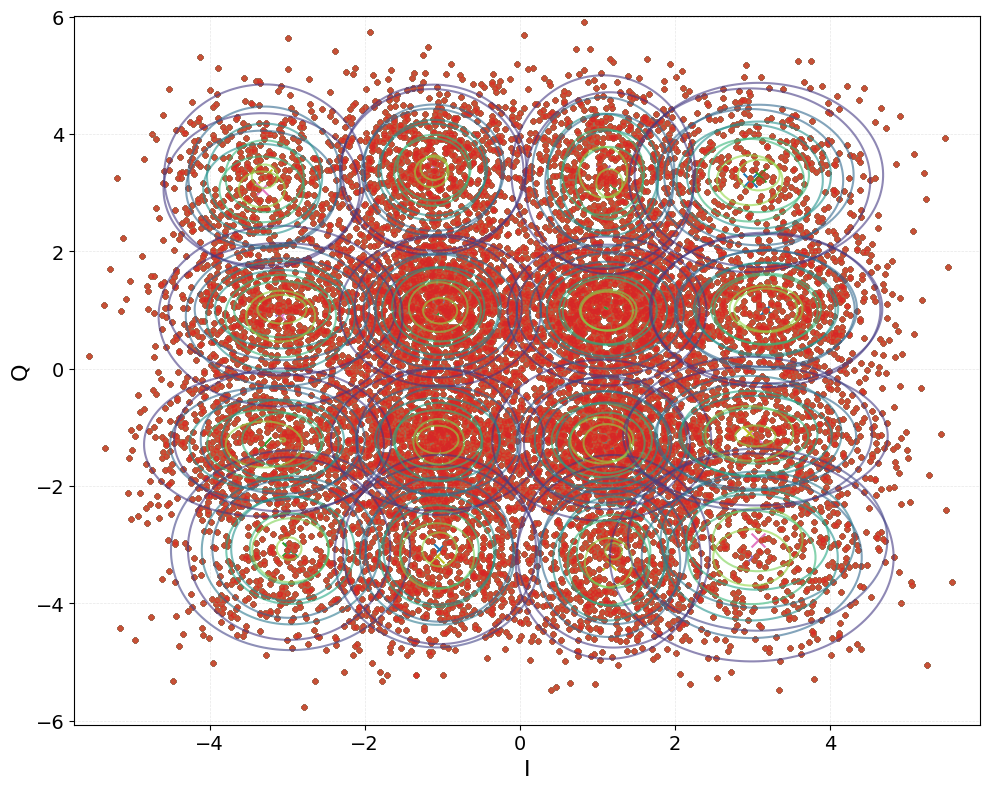

Covariance 0: [0.35282485 0.47528709]


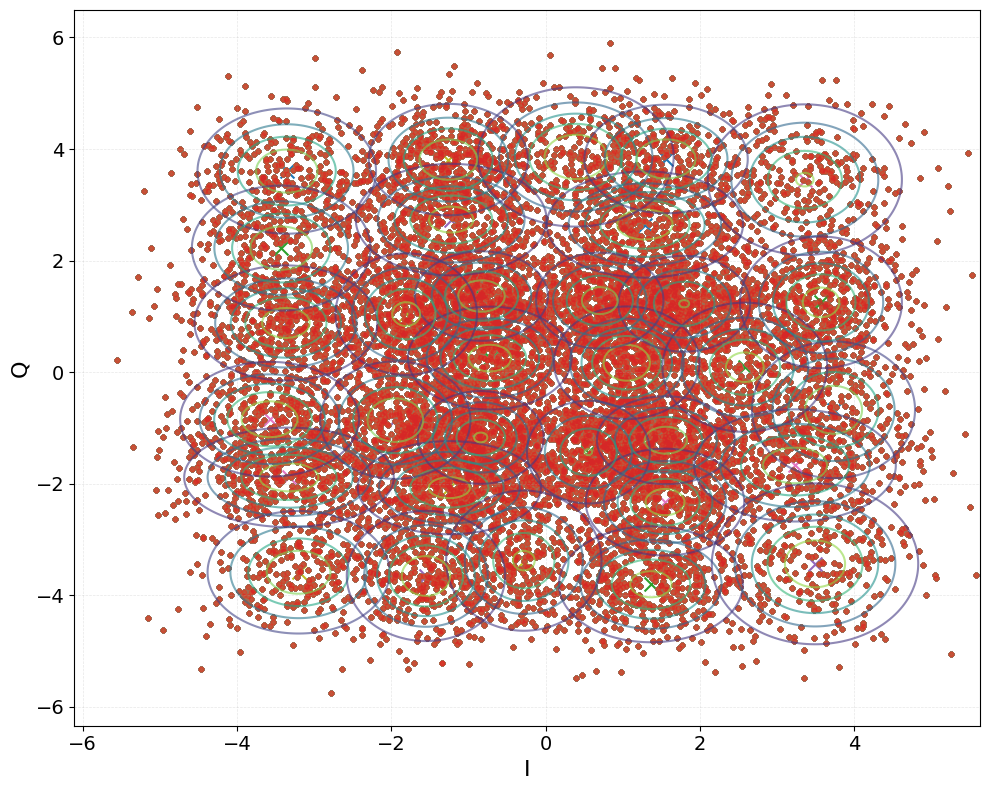

Covariance 0: 0.8612099566663359


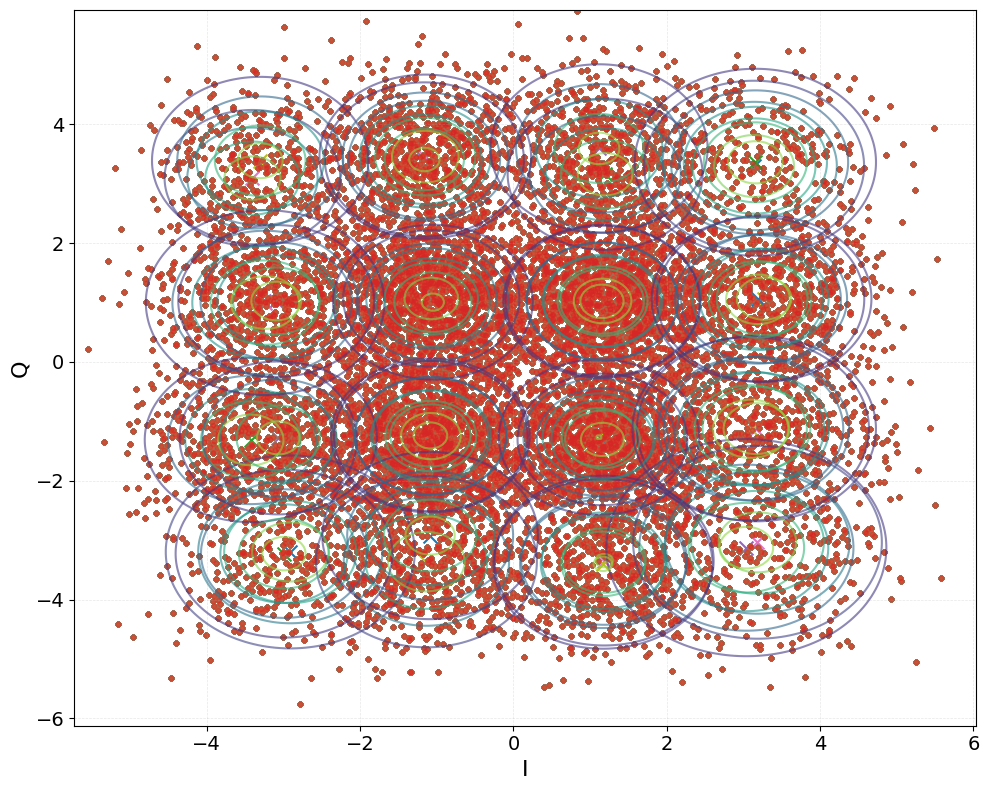

Covariance 0: 0.43449549779767044


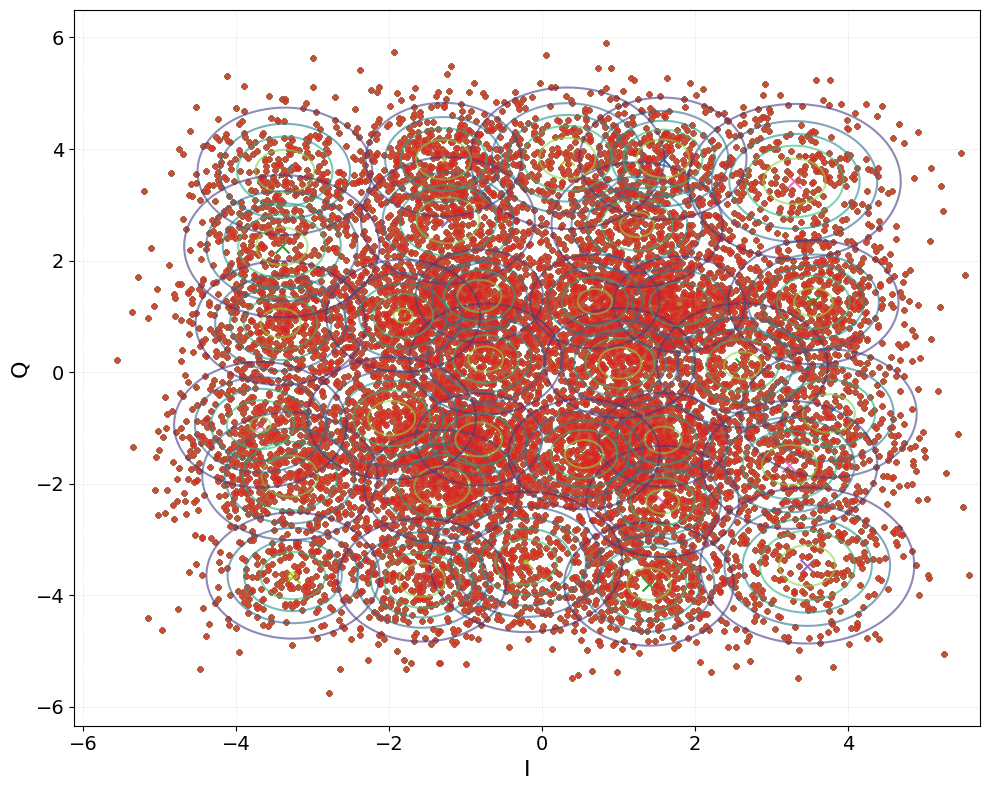

In [14]:
show_projected_gaussians(gmm2, n_componentes=16, covariance_type='diag', num_plots=2, init_centroids=True)
show_projected_gaussians(gmm2, n_componentes=16, covariance_type='diag', num_plots=2, init_centroids=False)

show_projected_gaussians(gmm2, n_componentes=16, covariance_type='spherical', num_plots=2, init_centroids=True)
show_projected_gaussians(gmm2, n_componentes=16, covariance_type='spherical', num_plots=2, init_centroids=False)

show_projected_gaussians(gmm2, n_componentes=32, covariance_type='diag', num_plots=2, init_centroids=True)
show_projected_gaussians(gmm2, n_componentes=32, covariance_type='diag', num_plots=2, init_centroids=False)

show_projected_gaussians(gmm2, n_componentes=32, covariance_type='spherical', num_plots=2, init_centroids=True)
show_projected_gaussians(gmm2, n_componentes=32, covariance_type='spherical', num_plots=2, init_centroids=False)